FeaturePlot(object = data.integrated, features = c("KRT18",'EPCAM','KRT7'), ncol = 1 )

options(repr.plot.width=7, repr.plot.height=7)

FeaturePlot(object = data.integrated, features = "BCL6", ncol = 1 )

FeaturePlot(object = data.integrated, features = "AICDA", ncol = 1 )

VlnPlot(object = data.integrated, features = c('KRT18', 'EPCAM', 'KRT7'),)

RidgePlot(data.integrated, features = c('KRT18'))

RidgePlot(data.integrated, features = c('EPCAM'))

FeaturePlot(object = data.integrated, features = c("RSPO3"), ncol = 1)

# dataの結合

In [108]:
library(Seurat)
library(Matrix)
library(ggplot2)
library(cowplot)
library(dplyr)
library(enrichR)
load('/data/komura//project//scRNA-seq_gastric_cancer//notebooks/Normal_Total_gastric.RData')

In [1]:
data.list <- c()
data.dirs <- list.files("/data/share/scRNAseq/results/human_STAD/",
                        full.names = TRUE,
                        pattern="N-total")

In [2]:
data.dirs

[1] "/data/share/scRNAseq/results/human_STAD//10N-total"
[2] "/data/share/scRNAseq/results/human_STAD//11N-total"
[3] "/data/share/scRNAseq/results/human_STAD//6N-total" 
[4] "/data/share/scRNAseq/results/human_STAD//8N-total" 
[5] "/data/share/scRNAseq/results/human_STAD//9N-total"

In [ ]:
for (i in 1:length(data.dirs)){
    data.list <- c(data.list, Read10X(paste0(data.dirs[i],"/outs/filtered_feature_bc_matrix")))
}
for (i in 1:length(data.dirs)){
    sample <- strsplit(data.dirs[i], "/")[[1]]
    sample <- sample[length(sample)]
    data.list[[i]] <- CreateSeuratObject(data.list[[i]], project = sample, min.cells = 2)
    data.list[[i]] <- NormalizeData(data.list[[i]], verbose = FALSE)
    data.list[[i]] <- FindVariableFeatures(object = data.list[[i]], 
        selection.method = "vst", nfeatures = 2000, verbose = FALSE)
}

In [ ]:
data.anchors <- FindIntegrationAnchors(object.list = data.list[1:5], dims = 1:30)

In [ ]:
data.integrated <- IntegrateData(anchorset = data.anchors, dims = 1:30)

In [1]:
# save(data.integrated, file = "Normal_Total_gastric2.RData")

load("Normal_Total_gastric_all_markers.RData")

In [4]:
load('RData//mat_all.RData')

In [109]:
# geneの発現量の平均値をとる
AddGeneSetScore <- function(data.integrated, genes){
    sum.exp <- rowSums(FetchData(object = data.integrated,
                                   vars = genes),
                          na.rm = TRUE)

    if (all(names(x = sum.exp) == rownames(x = data.integrated@meta.data))) {
      cat("Cell names order match in 'mean.exp' and 'object@meta.data':\n", 
          "adding gene set mean expression values in 'object@meta.data$gene.set.score'")
      return (sum.exp)
    }
}

# 読み込んでプロット

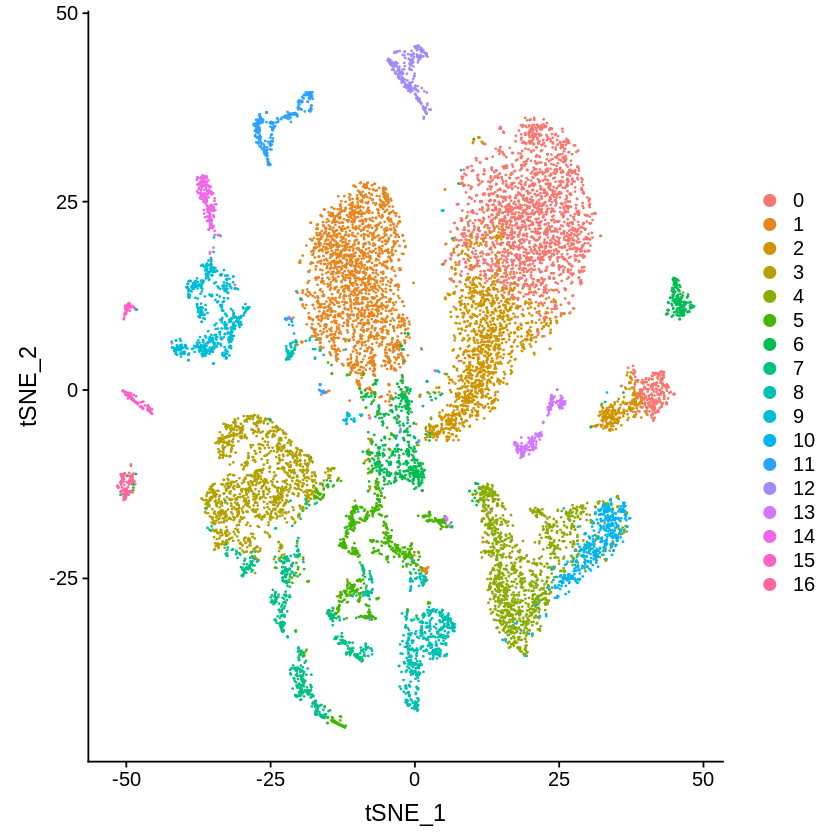

In [110]:
# switch to integrated assay. The variable features of this assay are
# automatically set during IntegrateData
DefaultAssay(object = data.integrated) <- "integrated"

# Run the standard workflow for visualization and clustering
data.integrated <- ScaleData(object = data.integrated, verbose = FALSE)
data.integrated <- RunPCA(object = data.integrated, npcs = 30, verbose = FALSE)
data.integrated <- RunTSNE(object = data.integrated, reduction = "pca", 
    dims = 1:30)
p1 <- DimPlot(object = data.integrated)
plot(p1)

In [ ]:
all.markers <- FindAllMarkers(object = data.integrated, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

In [ ]:
all.markers %>% group_by(cluster) %>% top_n(n = 5, wt = avg_logFC)

In [111]:
# 腺上皮っぽいものを同定しよう
stomach <- subset(x = data.integrated, idents = c(3,5,7,13))

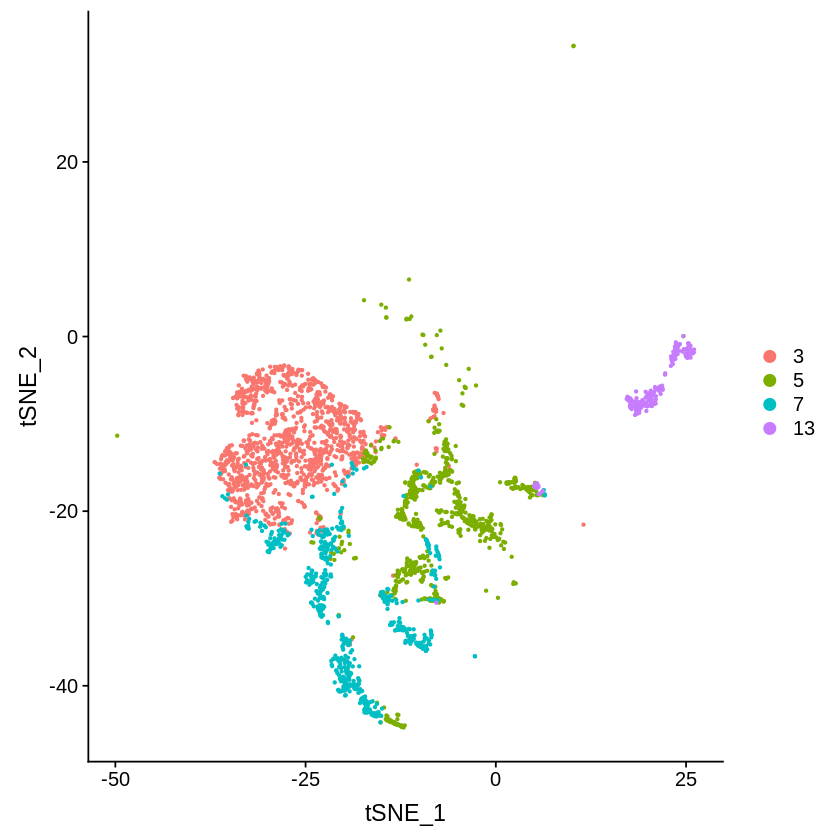

In [5]:
p2 <- DimPlot(object = stomach)
plot(p2)

In [115]:
head(all.markers)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
IGLL5,0,3.200854,0.804,0.534,0,0,IGLL5
JCHAIN,0,1.755687,1.000,0.956,0,0,JCHAIN
IGHA1,0,1.693054,1.000,0.939,0,0,IGHA1
SSR4,0,1.435737,1.000,0.697,0,0,SSR4
MZB1,0,1.424033,0.991,0.578,0,0,MZB1
IGHA2,0,1.410585,0.975,0.761,0,0,IGHA2


In [46]:
all.markers %>% filter(cluster==8) %>% top_n(n=5,wt=avg_logFC)　%>% select(gene)

gene
<chr>
PCLAF
STMN1
HMGB2
HMGN2
H2AFZ


In [116]:
stomach.3<- FindMarkers(object = stomach, ident.1 = 3, ident.2 = NULL, only.pos=TRUE,min.pct = 0.25, logfc.threshold = 0.25)

In [117]:
stomach.5<-FindMarkers(object = stomach, ident.1 = 5, ident.2 = NULL, only.pos=TRUE,min.pct = 0.25, logfc.threshold = 0.25)

In [118]:
stomach.7<- FindMarkers(object = stomach, ident.1 = 7, ident.2 = NULL, only.pos=TRUE,min.pct = 0.25, logfc.threshold = 0.25)

In [119]:
stomach.8 <- FindMarkers(object = stomach, ident.1 = 8, ident.2 = NULL, only.pos=TRUE,min.pct = 0.25, logfc.threshold = 0.25)

In [120]:
stomach.13<- FindMarkers(object = stomach, ident.1 = 13, ident.2 = NULL, only.pos=TRUE,min.pct = 0.25, logfc.threshold = 0.25)

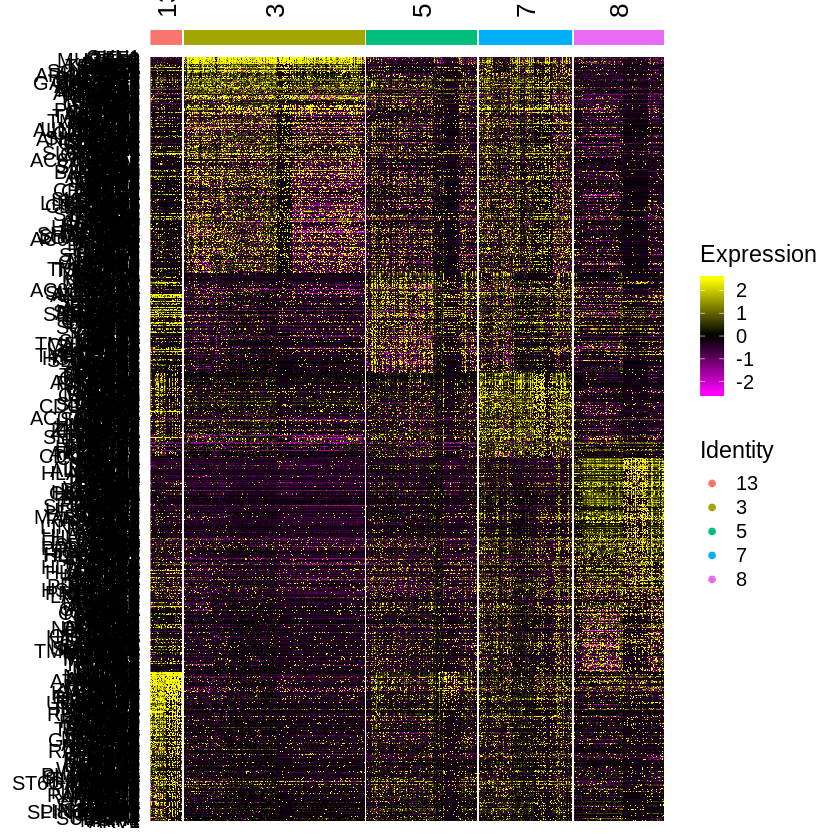

In [121]:
DoHeatmap(stomach, features=c(rownames(stomach.3),rownames(stomach.5), rownames(stomach.7),rownames(stomach.8), rownames(stomach.13)),angle=90)

In [122]:
data.integrated

An object of class Seurat 
18697 features across 13172 samples within 2 assays 
Active assay: integrated (2000 features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, tsne

[1] "3 = foveolar cell?"
[1] "7 = metaplasia?"
[1] "8 = stem cell?????"
[1] "9 = chief cell?"
[1] "13 = parietal cell"


Warning message in DoHeatmap(object = stomach, features = c("MUC5AC", "RNA_AQP4", :
“The following features were omitted as they were not found in the scale.data slot for the integrated assay: VIL1, rna_CDX2, RNA_AQP4”

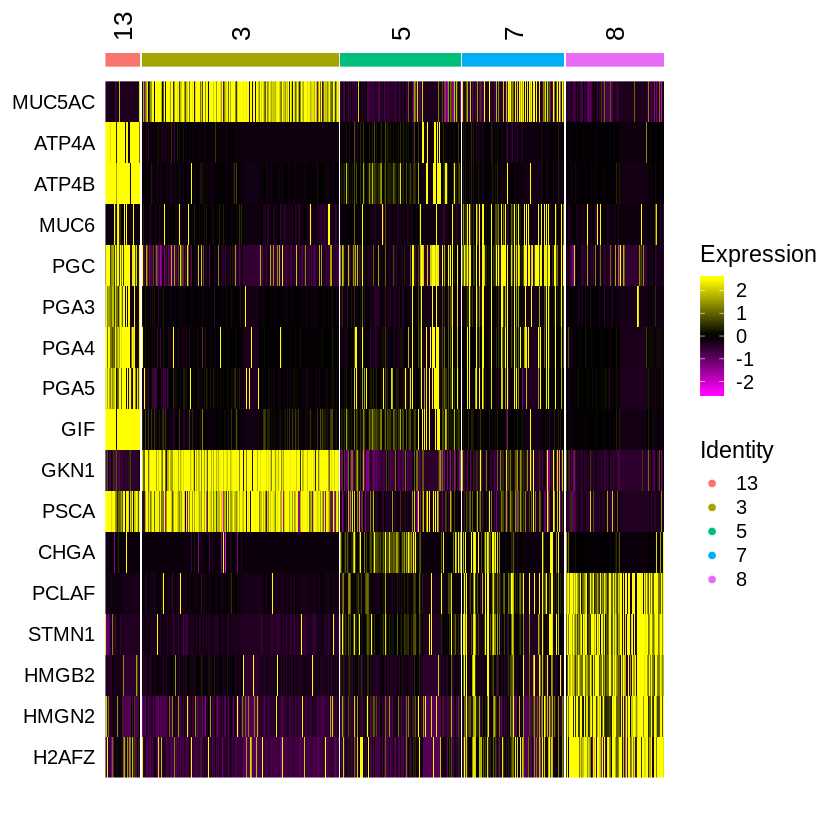

In [123]:
print('3 = foveolar cell?')
print('7 = metaplasia?')
print('8 = stem cell?????')
print('9 = chief cell?')
print('13 = parietal cell')
DoHeatmap(object = stomach, features = c('MUC5AC', 'RNA_AQP4','ATP4A','ATP4B','MUC6','PGC','PGA3',"PGA4","PGA5",
                                        "GIF","GKN1", "PSCA",'rna_CDX2','VIL1','CHGA', "PCLAF",
"STMN1",
"HMGB2",
"HMGN2",
"H2AFZ"), angle='90')

In [124]:
sum(stomach@active.ident==8)

[1] 616

In [125]:
# 細胞のクラスターとそれぞれの数
print(unique(stomach@active.ident))
print(paste("The number of cluster 3: ",sum(stomach@active.ident==3)))
print(paste("The number of cluster 5: ",sum(stomach@active.ident==5)))
print(paste("The number of cluster 7: ",sum(stomach@active.ident==7)))
print(paste("The number of cluster 8: ",sum(stomach@active.ident==8)))
print(paste("The number of cluster 13: ",sum(stomach@active.ident==13)))

[1] 3  5  7  8  13
Levels: 3 5 7 8 13
[1] "The number of cluster 3:  1237"
[1] "The number of cluster 5:  759"
[1] "The number of cluster 7:  641"
[1] "The number of cluster 8:  616"
[1] "The number of cluster 13:  218"


In [126]:
# 細胞の名前を指定
cells = c('10N-total','11N-total','6N-total','8N-total','9N-total') 

In [127]:
matrix_dir = "/data/share/scRNAseq/results/human_STAD/"

In [128]:
# dir
# mat_clusterにrawMatrixを格納
matrix_dir2 = '/outs/filtered_feature_bc_matrix/'
for(i in 1:length(cells)){
barcode.path <- paste0(matrix_dir, cells[i], matrix_dir2, "barcodes.tsv.gz")
features.path <- paste0(matrix_dir, cells[i], matrix_dir2, "features.tsv.gz")
matrix.path <- paste0(matrix_dir, cells[i], matrix_dir2, "matrix.mtx.gz")
mat <- readMM(file = matrix.path)
feature.names = read.delim(features.path, 
                           header = FALSE,
                           stringsAsFactors = FALSE)
barcode.names = read.delim(barcode.path, 
                           header = FALSE,
                           stringsAsFactors = FALSE)
colnames(mat) = paste0(sub('-1','_',barcode.names$V1),i) # SeuratだとUMI末尾が_., rawだと-1のため、変換
rownames(mat) = feature.names$V1

# cluster3
a <- stomach@meta.data[stomach@meta.data[,1]==cells[i],]
b <- a[a$integrated_snn_res.0.8==3,]
cluster3_UMI = rownames(b) 
    if(i==1){mat_cluster3=mat[,cluster3_UMI]}
    else {mat_cluster3=cbind(mat_cluster3,mat[,cluster3_UMI])}

# cluster5
a <- stomach@meta.data[stomach@meta.data[,1]==cells[i],]
b <- a[a$integrated_snn_res.0.8==5,]
cluster5_UMI = rownames(b)
    if(i==1){mat_cluster5=mat[,cluster5_UMI]}
    else {mat_cluster5=cbind(mat_cluster5,mat[,cluster5_UMI])}

# cluster7
a <- stomach@meta.data[stomach@meta.data[,1]==cells[i],]
b <- a[a$integrated_snn_res.0.8==7,]
cluster7_UMI = rownames(b)
    if(i==1){mat_cluster7=mat[,cluster7_UMI]}
    else {mat_cluster7=cbind(mat_cluster7,mat[,cluster7_UMI])}

# cluster8
a <- stomach@meta.data[stomach@meta.data[,1]==cells[i],]
b <- a[a$integrated_snn_res.0.8==8,]
cluster8_UMI = rownames(b)
    if(i==1){mat_cluster8=mat[,cluster8_UMI]}
    else {mat_cluster8=cbind(mat_cluster8,mat[,cluster8_UMI])}

    
# cluster13
a <- stomach@meta.data[stomach@meta.data[,1]==cells[i],]
b <- a[a$integrated_snn_res.0.8==13,]
cluster13_UMI = rownames(b)
    if(i==1){mat_cluster13=mat[,cluster13_UMI]}
    else {mat_cluster13=cbind(mat_cluster13,mat[,cluster13_UMI])}
}

In [129]:
# count matrixを統合
countA = as.matrix(cbind(mat_cluster3, mat_cluster5, mat_cluster7, mat_cluster8, mat_cluster13))

In [131]:
save(mat_cluster3,file='./RData/mat_cluster3.RData')
save(mat_cluster5,file='./RData/mat_cluster5.RData')
save(mat_cluster7,file='./RData/mat_cluster7.RData')
save(mat_cluster8,file='./RData/mat_cluster8.RData')
save(mat_cluster13,file='./RData/mat_cluster13.RData')
save(countA, file='./RData/mat_stomach.RData')

In [132]:
save(stomach,file='./RData/stomach.RData')

# DESingle

# --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 重いのでcommand lineからRscript DESingle.Rで代用

library(DEsingle)

### Detecting the DE genes
results3 <- DEsingle(counts = countA, group = groupA)
save(results3, file="./RData/cluster3_DEG_results.Rdata")

### Detecting the DE genes
results5 <- DEsingle(counts = countA, group = groupB)

### Detecting the DE genes
results7 <- DEsingle(counts = countA, group = groupC)

### Detecting the DE genes
results8 <- DEsingle(counts = countA, group = groupD)

### Detecting the DE genes
results13 <- DEsingle(counts = countA, group = groupE)

save(results5, file="./RData/cluster5_DEG_results.Rdata")
save(results7, file="./RData/cluster7_DEG_results.Rdata")
save(results11, file="./RData/cluster13_DEG_results.Rdata")

# -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [437]:
load('./RData/mat_cluster3.RData')
load('./RData/mat_cluster5.RData')
load('./RData/mat_cluster7.RData')
load('./RData/mat_cluster8.RData')
load('./RData/mat_cluster13.RData')

In [326]:
load("./RData/cluster3_DEG_results.Rdata")
load("./RData/cluster5_DEG_results.Rdata")
load("./RData/cluster7_DEG_results.Rdata")
load("./RData/cluster8_DEG_results.RData")
load("./RData/cluster13_DEG_results.Rdata")

In [327]:
load('./RData/stomach.RData')

In [328]:
number3 <- sum(stomach@active.ident==3)
number5 <- sum(stomach@active.ident==5)
number7 <- sum(stomach@active.ident==7)
number8 <- sum(stomach@active.ident==8)
number13 <- sum(stomach@active.ident==13)

In [329]:
total <- number3+number5+number7+number8+number13

In [330]:
groupA <- factor(c(rep(3,number3), rep("others",total-number3)))
groupB <- factor(c(rep("others",number3),rep(5,number5),rep("others",total-number3-number5)))
groupC <- factor(c(rep('others',number3+number5),rep(7,number7),rep('others',number8+number13)))
groupD <- factor(c(rep('others',number3+number5+number7),rep(8, number8), rep("others",number13)))
groupE <- factor(c(rep('others',number3+number5+number7+number8),rep(13,number13)))

In [331]:
# Extract DE genes at threshold of FDR < 0.05
results.classified <- DEtype(results = results3, threshold = 0.05)

results3.sig <- results.classified[results.classified$pvalue.adj.FDR < 0.05, ]

results5.classified <- DEtype(results = results5, threshold = 0.05)
results7.classified <- DEtype(results = results7, threshold = 0.05)
results8.classified <- DEtype(results = results8, threshold = 0.05)
results13.classified <- DEtype(results = results13, threshold = 0.05)

results5.sig <- results5.classified[results5.classified$pvalue.adj.FDR < 0.05, ]
results7.sig <- results7.classified[results7.classified$pvalue.adj.FDR < 0.05, ]
results8.sig <- results8.classified[results8.classified$pvalue.adj.FDR < 0.05, ]
results13.sig <- results13.classified[results13.classified$pvalue.adj.FDR < 0.05, ]

In [332]:
results3.sig <- results3.sig[results3.sig$State=='up',]
results5.sig <- results5.sig[results5.sig$State=='up',]
results7.sig <- results7.sig[results7.sig$State=='up',]
results8.sig <- results8.sig[results8.sig$State=='up',]
results13.sig <- results13.sig[results13.sig$State=='up',]

In [333]:
cluster3_top100genes <- results3.sig[order(results3.sig$pvalue.adj.FDR),][1:100,]
orderd_cluster3 <- results3.sig[order(results3.sig$pvalue.adj.FDR),]$Type

In [549]:
cluster3_top100genes %>% head

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,chi2LR1,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Remark,Type,State
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<chr>
GKN1,0.01097244,8.392362e-09,47.01381,5.269472,1.077400,0.1271631,0.02240326,0.02356341,38.878739,4.385407,⋯,2241.797,9.876973e-07,0,1.733996e-06,0,0,0,NA,DEg,up
GKN2,0.03494839,5.560003e-01,10.14602,3.161624,1.287282,0.2167924,0.11259059,0.06416984,7.899757,1.115936,⋯,1939.848,4.097168e-05,0,5.948805e-05,0,0,0,NA,DEg,up
MUC5AC,0.02429423,5.598494e-01,14.86725,6.598213,1.231173,0.2455893,0.07647787,0.03588492,11.937753,2.452999,⋯,1878.956,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
TFF1,0.01513810,9.163167e-09,35.29428,9.410922,1.586788,0.1680823,0.04302447,0.01754695,28.881164,8.009400,⋯,1844.301,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
TFF2,0.04373792,5.184350e-01,8.77338,5.794670,1.942085,0.3232793,0.18124133,0.05284112,6.683913,2.303491,⋯,1617.517,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
MUC1,0.03625294,5.626184e-01,9.23202,4.459066,1.562945,1.2521663,0.14478466,0.21924625,7.139854,1.516562,⋯,1334.925,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up


In [334]:
cluster5_top100genes <- results5.sig[order(results5.sig$pvalue.adj.FDR),][1:100,]
orderd_cluster5 <- results5.sig[order(results5.sig$pvalue.adj.FDR),]$Type

In [335]:
cluster7_top100genes <- results7.sig[order(results7.sig$pvalue.adj.FDR),][1:100,]
orderd_cluster7 <- results7.sig[order(results7.sig$pvalue.adj.FDR),]$Type

In [336]:
cluster8_top100genes <- results8.sig[order(results8.sig$pvalue.adj.FDR),][1:100,]
orderd_cluster8 <- results8.sig[order(results8.sig$pvalue.adj.FDR),]$Type

In [337]:
cluster13_top100genes <- results13.sig[order(results13.sig$pvalue.adj.FDR),][1:100,]
orderd_cluster13 <- results13.sig[order(results13.sig$pvalue.adj.FDR),]$Type

# 概要を見る(ヒートマップ)

In [338]:
load("./RData/cluster3_DEG_results.Rdata")

In [339]:
library(circlize)
library(ComplexHeatmap)

In [340]:
names3 <- rownames(cluster3_top100genes)
names5 <- rownames(cluster5_top100genes)
names7 <- rownames(cluster7_top100genes)
names8 <- rownames(cluster8_top100genes)
names13 <- rownames(cluster13_top100genes)

In [341]:
library(gplots)

In [343]:
options(repr.plot.width=7, repr.plot.height=7)

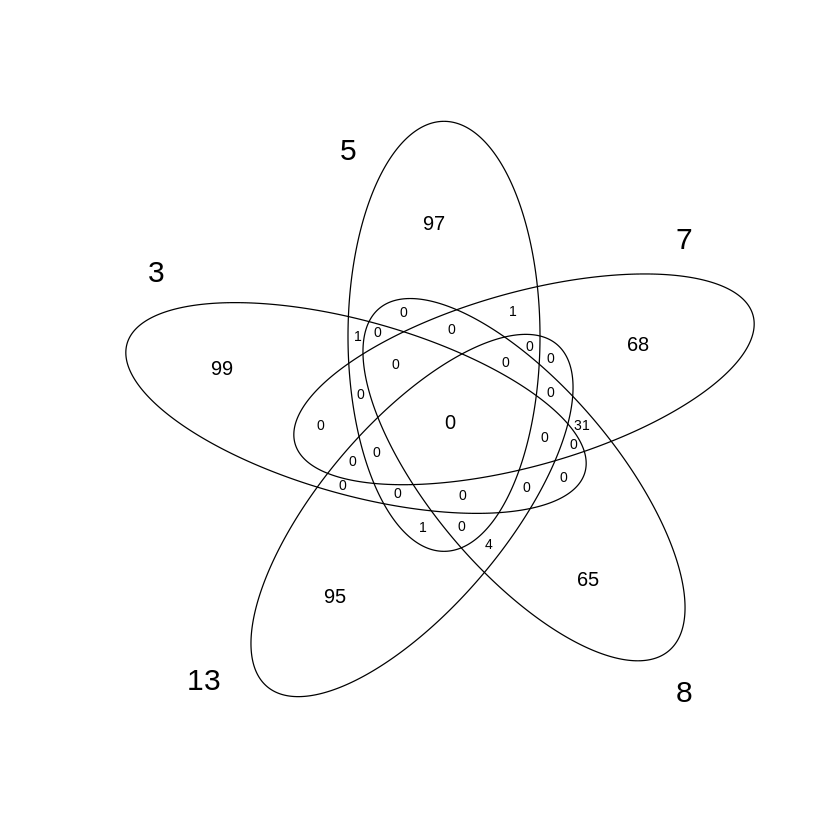

In [344]:
data <- list("3" = names3, "5" = names5, "7" = names7, "8" = names8, "13"=names13)
venn(data)

In [345]:
sig_genes <- union(union(union(union(names3,names5),names7),names8),names13)

In [346]:
length(sig_genes)

[1] 462

In [347]:
library(biomaRt)

In [348]:
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))

In [349]:
sig_pair <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=sig_genes, mart=mart)

In [350]:
sig_matrix = countA[sig_genes,]

In [351]:
sig_matrix_ <- sig_matrix/rowSums(sig_matrix)

In [352]:
sig_matrix_log <- log10(sig_matrix_+1)

In [353]:
sig_matrix2 <- t(scale(t((sig_matrix_log))))

In [354]:
col_fun = colorRamp2(c(-0.5,0,0.5),c('green','white','red'))

In [355]:
ha = HeatmapAnnotation(bar=c(rep("3",1237),rep("5",759),rep("7",641),rep('8',616),rep('13',218)),col = list(bar=c('3'='red','5'='green','7'='blue','8'='gray','13'='yellow')))

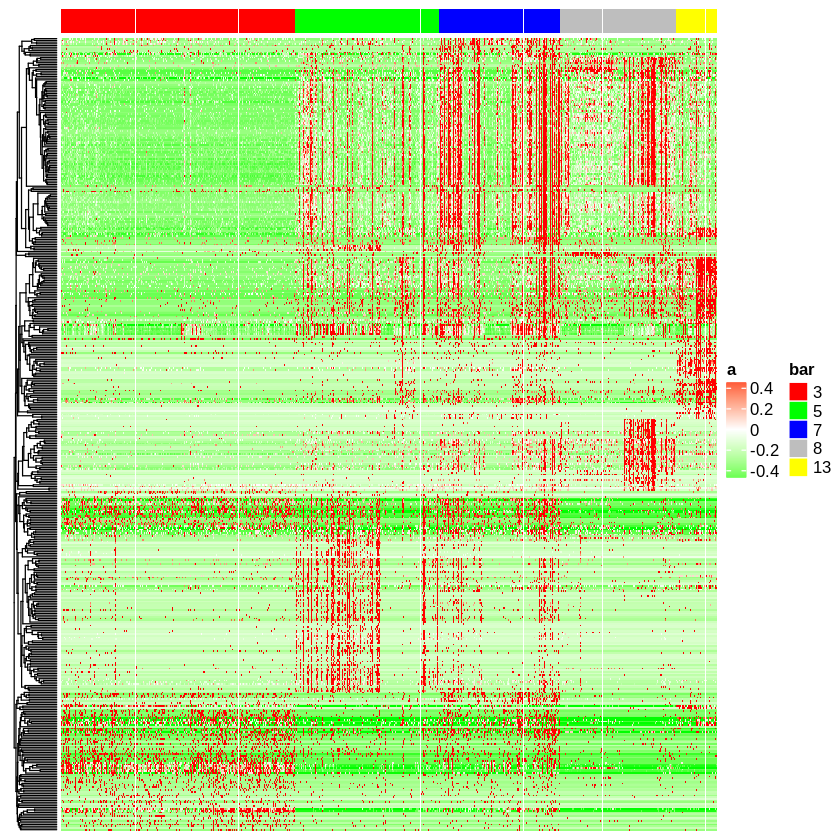

In [356]:
Heatmap(sig_matrix2,name='a',col=col_fun, show_column_names = F,show_column_dend = F, show_row_names = F, top_annotation = ha, cluster_columns = F)

# 各クラスター固有のDEGを調べてみる

## まずensembl id -> gene symbolへ

In [357]:
library(biomaRt)

In [358]:
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))

In [359]:
list3 <- rownames(cluster3_top100genes[1:100,])

pair3 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list3,mart=mart)

cluster3_top100genes['ensembl_gene_id'] <- rownames(cluster3_top100genes)

cluster3_top100genes <- dplyr::inner_join(cluster3_top100genes,pair3,by='ensembl_gene_id')

rownames(cluster3_top100genes) <- cluster3_top100genes$hgnc_symbol

cluster3_top100genes <- cluster3_top100genes[,-length(cluster3_top100genes)][,-length(cluster3_top100genes)+1]

cluster3_top100genes %>% head

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,chi2LR1,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Remark,Type,State
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<chr>
GKN1,0.01097244,8.392362e-09,47.01381,5.269472,1.077400,0.1271631,0.02240326,0.02356341,38.878739,4.385407,⋯,2241.797,9.876973e-07,0,1.733996e-06,0,0,0,NA,DEg,up
GKN2,0.03494839,5.560003e-01,10.14602,3.161624,1.287282,0.2167924,0.11259059,0.06416984,7.899757,1.115936,⋯,1939.848,4.097168e-05,0,5.948805e-05,0,0,0,NA,DEg,up
MUC5AC,0.02429423,5.598494e-01,14.86725,6.598213,1.231173,0.2455893,0.07647787,0.03588492,11.937753,2.452999,⋯,1878.956,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
TFF1,0.01513810,9.163167e-09,35.29428,9.410922,1.586788,0.1680823,0.04302447,0.01754695,28.881164,8.009400,⋯,1844.301,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
TFF2,0.04373792,5.184350e-01,8.77338,5.794670,1.942085,0.3232793,0.18124133,0.05284112,6.683913,2.303491,⋯,1617.517,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
MUC1,0.03625294,5.626184e-01,9.23202,4.459066,1.562945,1.2521663,0.14478466,0.21924625,7.139854,1.516562,⋯,1334.925,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up


In [259]:
list5 <- rownames(cluster5_top100genes[1:100,])

pair5 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list5,mart=mart)

cluster5_top100genes['ensembl_gene_id'] <- rownames(cluster5_top100genes)

cluster5_top100genes <- dplyr::inner_join(cluster5_top100genes,pair5,by='ensembl_gene_id')

rownames(cluster5_top100genes) <- cluster5_top100genes$hgnc_symbol

cluster5_top100genes <- cluster5_top100genes[,-length(cluster5_top100genes)][,-length(cluster5_top100genes)+1]

cluster5_top100genes %>% head

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,chi2LR1,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Remark,Type,State
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<chr>
FABP2,0.3970129,0.9438310,6.718870,2.684955,0.3475099,12.71744926,0.04917792,0.82567951,3.674572,0.1098820,⋯,665.5056,0,0.000000e+00,0,0.000000e+00,0,0,NA,DEg,up
PHGR1,0.1285460,0.3834479,20.107815,5.191116,0.3102788,0.90010842,0.01519627,0.14777133,16.000000,2.6500737,⋯,665.4155,0,0.000000e+00,0,0.000000e+00,0,0,NA,DEg,up
PRAP1,0.5237483,0.9199801,13.976070,2.843149,0.6338177,1.26052339,0.04338279,0.30716962,5.833992,0.1703540,⋯,661.3478,0,0.000000e+00,0,0.000000e+00,0,0,NA,DEg,up
FABP1,0.1959834,0.3877913,11.467458,0.834175,0.2089873,0.04302853,0.01789820,0.04905193,8.706192,0.4992625,⋯,604.8865,0,3.241851e-14,0,7.215575e-13,0,0,NA,DEg,up
RBP2,0.3124696,0.9349273,5.710611,2.923891,0.2487000,0.82876610,0.04173302,0.22084781,3.708827,0.1710914,⋯,550.6371,0,1.662237e-11,0,2.989991e-10,0,0,NA,DEg,up
ANPEP,0.5327651,0.9351720,7.122888,4.942738,0.9820007,0.99191508,0.12116152,0.16713952,2.824769,0.2853982,⋯,547.3165,0,4.722017e-03,0,1.277466e-02,0,0,NA,DEg,up


In [319]:
mat_cluster5_ <- as.data.frame(mat_cluster5[sig_genes,])
mat_cluster5_['ensembl_gene_id'] <- sig_genes
mat_cluster5_ <- inner_join(mat_cluster5_,sig_pair, by='ensembl_gene_id')
rownames(mat_cluster5_) <- mat_cluster5_$hgnc_symbol
mat_cluster5 <- mat_cluster5_[,-length(mat_cluster5_)][,-length(mat_cluster5_)+1]
head(mat_cluster5)

,AAACCTGGTCCAAGTT_1,AAACCTGGTGCACCAC_1,AAAGCAAGTAGCTTGT_1,AAATGCCAGATCCGAG_1,AACCGCGGTCGGCACT_1,AACGTTGGTGGTTTCA_1,AACTCCCTCAGCTCGG_1,AAGGTTCTCCTGCTTG_1,AATCGGTAGCCACTAT_1,ACATGGTAGGAGTACC_1,⋯,TGACAACGTGACTCAT_5,TGACGGCCACATCCGG_5,TGAGAGGTCTTGTTTG_5,TGGCCAGGTCGCTTCT_5,TGGCGCAGTACTTAGC_5,TGGGCGTAGATAGGAG_5,TGTGTTTGTAAAGGAG_5,TTAGTTCCACCCTATC_5,TTCTCAATCCCAGGTG_5,TTTCCTCTCTTCAACT_5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IGHM,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
FABP2,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
PHGR1,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
PRAP1,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
FABP1,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
RBP2,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [260]:
list7 <- rownames(cluster7_top100genes[1:100,])

pair7 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list7,mart=mart)

cluster7_top100genes['ensembl_gene_id'] <- rownames(cluster7_top100genes)

cluster7_top100genes <- dplyr::inner_join(cluster7_top100genes,pair7,by='ensembl_gene_id')

rownames(cluster7_top100genes) <- cluster7_top100genes$hgnc_symbol

cluster7_top100genes <- cluster7_top100genes[,-length(cluster7_top100genes)][,-length(cluster7_top100genes)+1]

cluster7_top100genes %>% head

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,chi2LR1,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Remark,Type,State
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<chr>
RPL41,6.615927e-10,1.542094e-09,45.558502,9.450177,0.6159259,7.417361e-01,0.01333911,0.07277693,44.009360,8.1014134,⋯,1018.7542,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
AGR2,1.047796e-08,3.912093e-01,14.361934,3.813387,0.6040499,1.337117e+00,0.04036152,0.25960897,13.112324,1.7335689,⋯,1003.4788,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
LYZ,1.524722e-09,2.517563e-01,25.965679,4.047161,0.4476377,5.779252e-01,0.01694743,0.12495449,23.692668,2.3445230,⋯,1000.2736,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
RPL36,1.927895e-09,1.259775e-01,18.809672,4.853479,0.7008304,9.540935e-01,0.03592067,0.16428439,17.748830,3.4544170,⋯,848.7137,1.673024e-08,0,2.832164e-08,0,0,0,NA,DEg,up
MT1E,2.678173e-01,7.489598e-01,4.615098,2.283080,1.3683831,1.153464e+04,0.22869348,0.99980211,2.819033,0.3462898,⋯,815.0329,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up
RPL31,6.092348e-02,4.343610e-01,9.439355,3.467731,0.6861047,2.043816e+00,0.06776034,0.37082440,8.171607,1.4787986,⋯,781.9151,0.000000e+00,0,0.000000e+00,0,0,0,NA,DEg,up


In [261]:
list8 <- rownames(cluster8_top100genes[1:100,])

pair8 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list8,mart=mart)

cluster8_top100genes['ensembl_gene_id'] <- rownames(cluster8_top100genes)

cluster8_top100genes <- dplyr::inner_join(cluster8_top100genes,pair8,by='ensembl_gene_id')

rownames(cluster8_top100genes) <- cluster8_top100genes$hgnc_symbol

cluster8_top100genes <- cluster8_top100genes[,-length(cluster8_top100genes)][,-length(cluster8_top100genes)+1]

cluster8_top100genes %>% head

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,chi2LR1,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Remark,Type,State
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<chr>
RPL19,3.487929e-09,1.307568e-01,16.527597,4.199156,1.1580839,4.258792e-01,0.06548144,0.09208130,14.251623,3.12644483,⋯,862.4251,1.011333e-08,0.000000e+00,2.705496e-08,0.000000e+00,0,0,NA,DEg,up
H2AFZ,3.087495e-02,7.679003e-01,5.070513,2.840134,0.5774477,1.616083e+00,0.10224003,0.36265805,4.285714,0.49807356,⋯,766.5751,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
SMIM14,6.828746e-01,7.468306e-01,7.658078,2.119539,1.0439735,1.688592e+04,0.11996866,0.99987449,2.071429,0.31873905,⋯,670.3491,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
CKS2,4.151147e-01,9.450686e-01,3.005918,2.289117,0.8831648,8.197655e+00,0.22708823,0.78171389,1.417208,0.08441331,⋯,591.7435,0.000000e+00,1.870248e-11,0.000000e+00,4.330709e-10,0,0,NA,DEg,up
HMGB1,2.879741e-08,5.767341e-01,6.139610,3.051909,0.5176116,1.491784e+00,0.07775189,0.32831974,5.436688,0.99019264,⋯,591.3185,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
PTMA,4.918699e-10,6.539815e-09,24.439935,7.035727,0.9225041,4.671487e-01,0.03637285,0.06226263,22.527597,6.17162872,⋯,589.2443,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up


In [262]:
list13 <- rownames(cluster13_top100genes[1:100,])

pair13 <- getBM(filters= "ensembl_gene_id", attributes=c("ensembl_gene_id",'hgnc_symbol'),
              values=list13,mart=mart)

cluster13_top100genes['ensembl_gene_id'] <- rownames(cluster13_top100genes)

cluster13_top100genes <- dplyr::inner_join(cluster13_top100genes,pair13,by='ensembl_gene_id')

rownames(cluster13_top100genes) <- cluster13_top100genes$hgnc_symbol

cluster13_top100genes <- cluster13_top100genes[,-length(cluster13_top100genes)][,-length(cluster13_top100genes)+1]

cluster13_top100genes %>% head

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,chi2LR1,pvalue_LR2,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Remark,Type,State
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<chr>
CBLIF,9.535257e-09,0.9786869,8.669725,2.408716,0.6419440,1.729900e+00,0.06893973,0.4179899,7.463303,0.03442976,⋯,1009.2460,3.708145e-14,6.810219e-12,1.658133e-13,1.569737e-10,0,0,NA,DEg,up
ATP4B,4.533153e-03,0.9783443,13.404795,2.881636,0.5119484,9.738230e-01,0.03678651,0.2525829,11.784404,0.04426683,⋯,990.2337,0.000000e+00,7.425394e-12,0.000000e+00,1.692827e-10,0,0,NA,DEg,up
CKB,6.984145e-02,0.9447771,7.219840,2.265640,1.2906137,1.175548e+04,0.15165039,0.9998073,5.642202,0.07500769,⋯,976.8106,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
ATP4A,7.753033e-02,0.9733193,14.793756,1.993263,0.3987559,4.715176e-01,0.02624687,0.1913020,12.041284,0.03688903,⋯,823.7303,0.000000e+00,8.935075e-11,0.000000e+00,1.783595e-09,0,0,NA,DEg,up
GLUL,2.857714e-02,0.7694973,10.228067,2.653952,0.7607992,2.712016e+00,0.06923364,0.5054104,8.600917,0.41530895,⋯,771.7443,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up
ALDH1A1,3.408858e-02,0.7354328,10.523880,2.782822,0.6433841,2.279026e+00,0.05761340,0.4502360,8.816514,0.52997233,⋯,699.7841,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0,0,NA,DEg,up


## Cluster3 解析スタート

In [193]:
head(cluster3_top100genes)

,theta_1,theta_2,mu_1,mu_2,size_1,size_2,prob_1,prob_2,total_mean_1,total_mean_2,⋯,pvalue_LR3,FDR_LR2,FDR_LR3,pvalue,pvalue.adj.FDR,Remark,Type,State,ensembl_gene_id,hgnc_symbol
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<chr>,<chr>,<chr>
GKN1,0.01097244,8.392362e-09,47.01381,5.269472,1.077400,0.1271631,0.02240326,0.02356341,38.878739,4.385407,⋯,0,1.733996e-06,0,0,0,NA,DEg,up,ENSG00000169605,GKN1
GKN2,0.03494839,5.560003e-01,10.14602,3.161624,1.287282,0.2167924,0.11259059,0.06416984,7.899757,1.115936,⋯,0,5.948805e-05,0,0,0,NA,DEg,up,ENSG00000183607,GKN2
MUC5AC,0.02429423,5.598494e-01,14.86725,6.598213,1.231173,0.2455893,0.07647787,0.03588492,11.937753,2.452999,⋯,0,0.000000e+00,0,0,0,NA,DEg,up,ENSG00000215182,MUC5AC
TFF1,0.01513810,9.163167e-09,35.29428,9.410922,1.586788,0.1680823,0.04302447,0.01754695,28.881164,8.009400,⋯,0,0.000000e+00,0,0,0,NA,DEg,up,ENSG00000160182,TFF1
TFF2,0.04373792,5.184350e-01,8.77338,5.794670,1.942085,0.3232793,0.18124133,0.05284112,6.683913,2.303491,⋯,0,0.000000e+00,0,0,0,NA,DEg,up,ENSG00000160181,TFF2
MUC1,0.03625294,5.626184e-01,9.23202,4.459066,1.562945,1.2521663,0.14478466,0.21924625,7.139854,1.516562,⋯,0,0.000000e+00,0,0,0,NA,DEg,up,ENSG00000185499,MUC1


In [388]:
list3 <- rownames(cluster3_top100genes)

In [293]:
list5 <- rownames(cluster5_top100genes)

In [294]:
list7 <- rownames(cluster7_top100genes)

In [295]:
list8 <- rownames(cluster8_top100genes)

In [296]:
list13 <- rownames(cluster13_top100genes)

In [297]:
list3_unique = setdiff(setdiff(setdiff(setdiff(list3,list5),list7),list8),list13)

In [298]:
list3_genes <- list3_unique[!startsWith(list3_unique,'RPL')]

In [299]:
list3_genes <- list3_genes[!startsWith(list3_genes,'MT-')]

In [300]:
list3_genes <- list3_genes[!startsWith(list3_genes,'RPS')]

In [301]:
options(repr.plot.width=49, repr.plot.height=7)

"""
# mat_cluster3とlist3_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(list3_ensemble$ensembl_gene_id, rownames(mat_cluster3))

for (i in 1:98){
    ensembl <- ensembl_gene_id_T[i] 
    if(i==1)hoge <- list3_ensemble[list3_ensemble$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,list3_ensemble[list3_ensemble$ensembl_gene_id==ensembl,])
    }
}

list3_ensemble <- hoge
###
plot_list <- list()

In [390]:
plot_list <- list()

# いろいろやった

In [424]:
test <- getBM(filters= "hgnc_symbol", attributes=c("hgnc_symbol","ensembl_gene_id"),
              values=list3_genes,mart=mart)

test2 <- as.data.frame(list3_genes)

colnames(test2) <- "hgnc_symbol"

test3 <- inner_join(test2,test,by="hgnc_symbol")

In [440]:
# mat_cluster3とlist3_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(test3$ensembl_gene_id, rownames(mat_cluster3))

for (i in 1:length(list3_genes)){
    ensembl <- ensembl_gene_id_T[i] 
    if(i==1)hoge <- test3[test3$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,test3[test3$ensembl_gene_id==ensembl,])
    }
}

list3_ensemble <- hoge

In [454]:
for (i in 1:length(list3_genes)){
    gene_symbol_ <- list3_genes[i]
    gene_symbol <- list3_ensemble$ensembl_gene_id[i]
    df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[gene_symbol,]),
                             cbind(cluster='5',ex=mat_cluster5[gene_symbol,]),
                             cbind(cluster='7',ex=mat_cluster7[gene_symbol,]),
                             cbind(cluster='8',ex=mat_cluster8[gene_symbol,]),
                             cbind(cluster='13',ex=mat_cluster13[gene_symbol,])))
    df$ex <- as.numeric(df$ex)
    p <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
    p <- p+geom_violin(trim=FALSE)+labs(title=paste(gene_symbol_,' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))
    plot_list[[i]] <- p
}

In [458]:
options(repr.plot.width=49, repr.plot.height=7)

In [499]:
length(list3_genes)%/%5

[1] 19

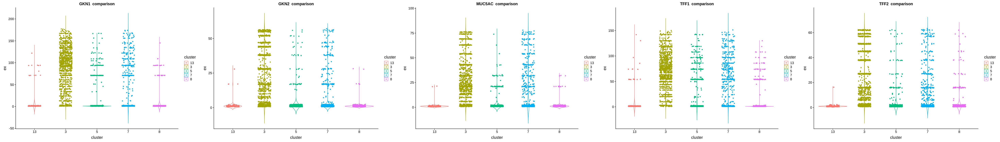

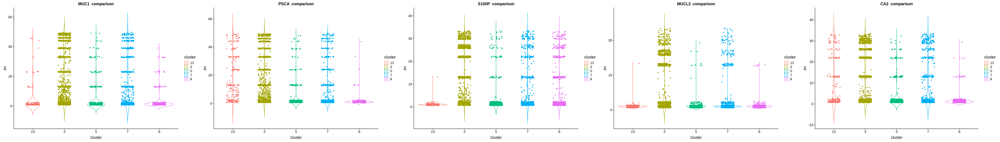

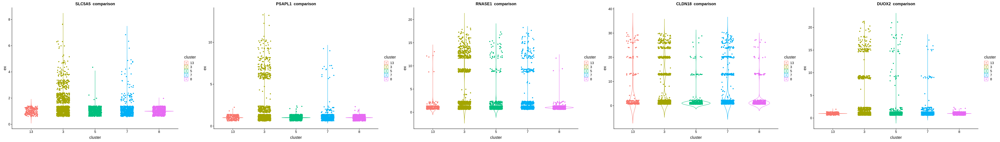

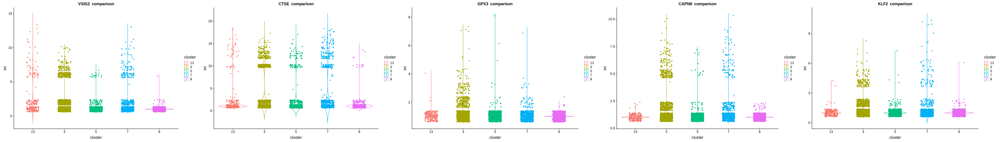

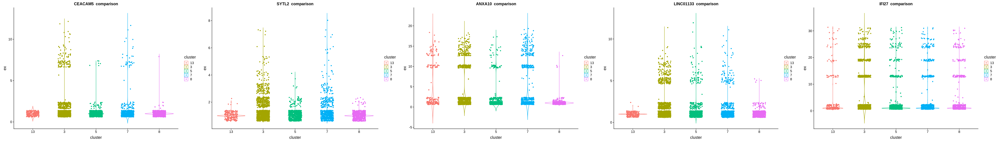

...

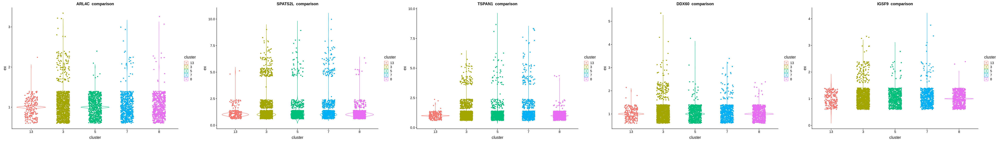

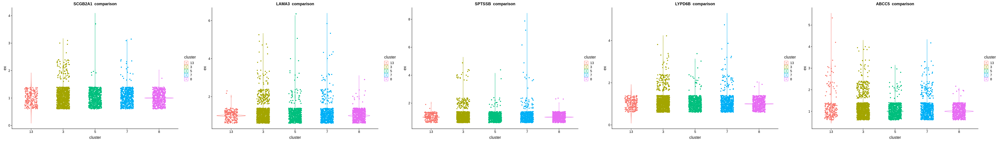

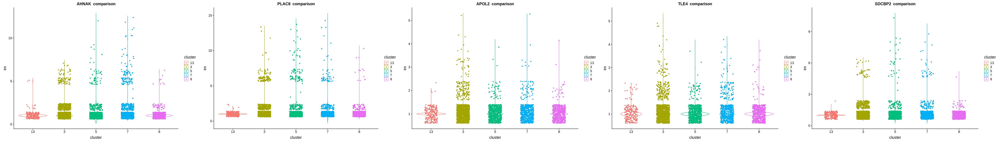

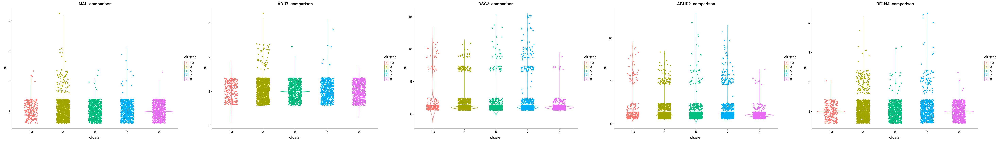

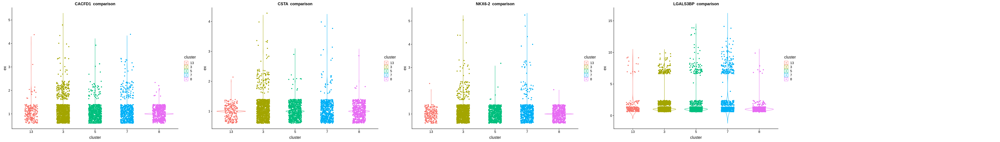

In [474]:
for (i in 0:(length(list3_genes)%/%5)){
    p1 <- suppressMessages(plot_list[[(5*i+1)]])
#        if (class(p1)=="try-error") break
    p2 <- suppressMessages(plot_list[[(5*i+2)]])
 #       if (class(p2)=="try-error") break
    p3 <- suppressMessages(plot_list[[(5*i+3)]])
  #      if (class(p3)=="try-error") break
    p4 <- suppressMessages(plot_list[[(5*i+4)]])
   #     if (class(p4)=="try-error") break
    if (i!=length(list3_genes)%/%5) p5 <- suppressMessages(plot_list[[(5*i+5)]])
    #    if (class(p5)=="try-error") break
    
    if (i!=length(list3_genes)%/%5)gridExtra::grid.arrange(p1, p2, p3, p4, p5, ncol = 5)
    if (i==length(list3_genes)%/%5)gridExtra::grid.arrange(p1, p2, p3, p4, ncol = 5)
}

for (i in 0:19){
#1つめ
ensemble1 <- list3_ensemble$ensembl_gene_id[5*i+1]
df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble1,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble1,]),
cbind(cluster="7",ex=mat_cluster7[ensemble1,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble1,])))

df$ex <- as.numeric(df$ex)
p1 <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
p1 <- p1+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+1],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 2つめ
ensemble2 <- list3_ensemble$ensembl_gene_id[5*i+2]
df2 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble2,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble2,]),
cbind(cluster="7",ex=mat_cluster7[ensemble2,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble2,])))
df2$ex <- as.numeric(df2$ex)
p2 <- ggplot(df2,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p2 <- p2+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+2],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# ３つ目
ensemble3 <- list3_ensemble$ensembl_gene_id[5*i+3]
df3 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble3,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble3,]),
cbind(cluster="7",ex=mat_cluster7[ensemble3,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble3,])))
df3$ex <- as.numeric(df3$ex)
p3 <- ggplot(df3,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p3 <- p3+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+3],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 4つめ
ensemble4 <- list3_ensemble$ensembl_gene_id[5*i+4]
df4 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble4,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble4,]),
cbind(cluster="7",ex=mat_cluster7[ensemble4,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble4,])))
df4$ex <- as.numeric(df4$ex)
p4 <- ggplot(df4,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p4 <- p4+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+4],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

# 5つめ
ensemble5 <- list3_ensemble$ensembl_gene_id[5*i+5]
df5 <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[ensemble5,]),
                          cbind(cluster="5",ex=mat_cluster5[ensemble5,]),
cbind(cluster="7",ex=mat_cluster7[ensemble5,]),cbind(cluster="13",
                                                           ex=mat_cluster13[ensemble5,])))
df5$ex <- as.numeric(df5$ex)
p5 <- ggplot(df5,aes(x=cluster,y=ex,colour=cluster),fontsize=24)
p5 <- p5+geom_violin(trim=FALSE)+labs(title=paste(list3_ensemble$hgnc_symbol[5*i+5],' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))

plot_list[[5*i+1]] <- p1
plot_list[[5*i+2]] <- p2
plot_list[[5*i+3]] <- p3
plot_list[[5*i+4]] <- p4
plot_list[[5*i+5]] <- p5
}

# CLuster 5 (Chief cell)

In [475]:
list5_unique = setdiff(setdiff(setdiff(setdiff(list5,list3),list7),list8),list13)

list5_genes <- list5_unique[!startsWith(list5_unique,'RPL')]

list5_genes <- list5_genes[!startsWith(list5_genes,'MT-')]

list5_genes <- list5_genes[!startsWith(list5_genes,'RPS')]

In [301]:
options(repr.plot.width=49, repr.plot.height=7)

In [476]:
plot_list <- list()

In [477]:
test <- getBM(filters= "hgnc_symbol", attributes=c("hgnc_symbol","ensembl_gene_id"),
              values=list5_genes,mart=mart)

test2 <- as.data.frame(list5_genes)

colnames(test2) <- "hgnc_symbol"

test3 <- inner_join(test2,test,by="hgnc_symbol")

Warning message:
“Column `hgnc_symbol` joining factor and character vector, coercing into character vector”

In [491]:
# mat_cluster3とlist3_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(test3$ensembl_gene_id, rownames(mat_cluster5))

for (i in 1:length(list5_genes)){
    ensembl <- ensembl_gene_id_T[i] 
    if(i==1)hoge <- test3[test3$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,test3[test3$ensembl_gene_id==ensembl,])
    }
}

list5_ensemble <- hoge

In [493]:
plot_list <- list()

In [494]:
for (i in 1:length(list5_genes)){
    gene_symbol_ <- list5_genes[i]
    gene_symbol <- list5_ensemble$ensembl_gene_id[i]
    df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[gene_symbol,]),
                             cbind(cluster='5',ex=mat_cluster5[gene_symbol,]),
                             cbind(cluster='7',ex=mat_cluster7[gene_symbol,]),
                             cbind(cluster='8',ex=mat_cluster8[gene_symbol,]),
                             cbind(cluster='13',ex=mat_cluster13[gene_symbol,])))
    df$ex <- as.numeric(df$ex)
    p <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
    p <- p+geom_violin(trim=FALSE)+labs(title=paste(gene_symbol_,' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))
    plot_list[[i]] <- p
}

In [495]:
options(repr.plot.width=49, repr.plot.height=7)

In [498]:
i

[1] 19

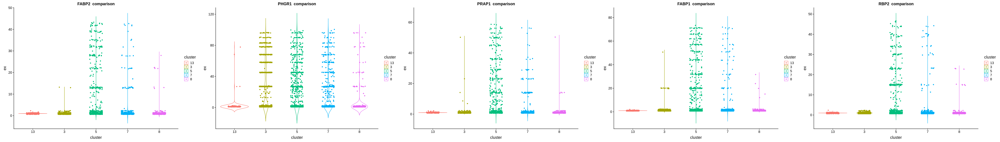

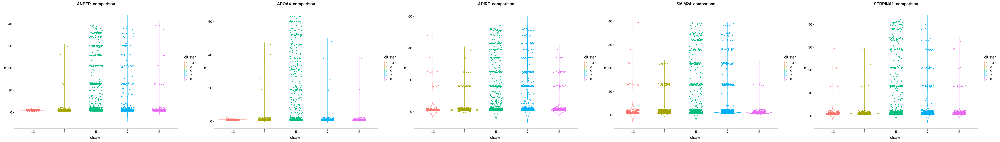

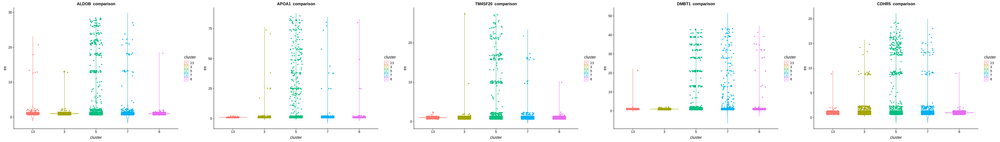

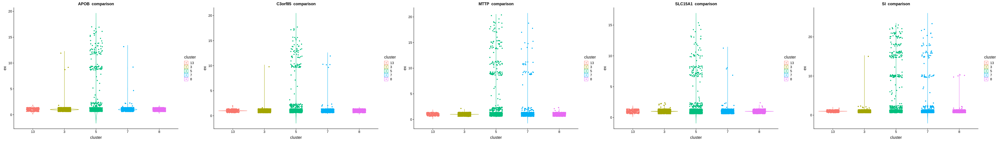

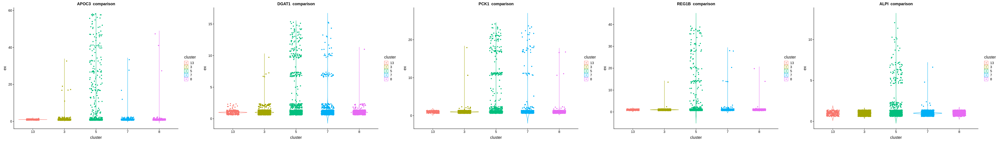

...

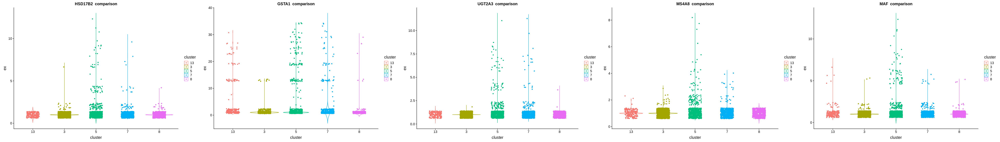

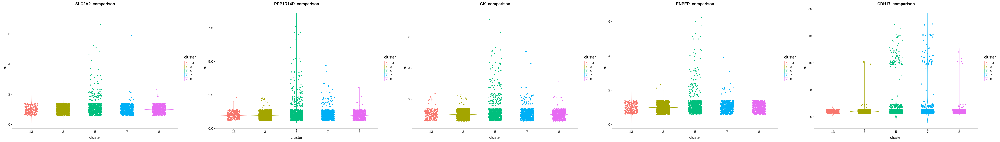

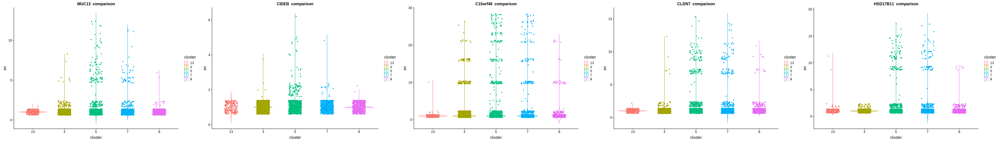

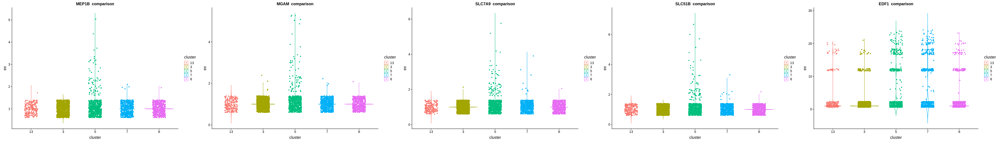

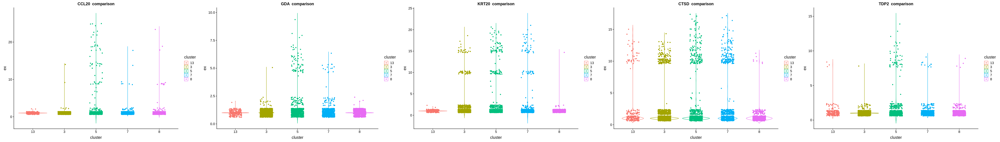

ERROR: Error in plot_list[[(5 * i + 2)]]: subscript out of bounds


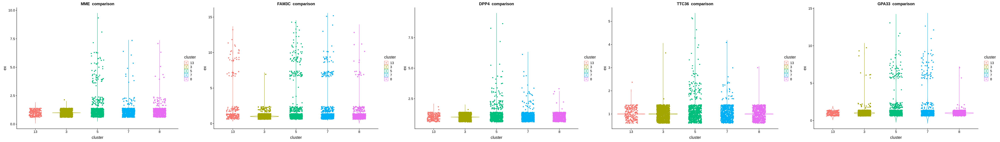

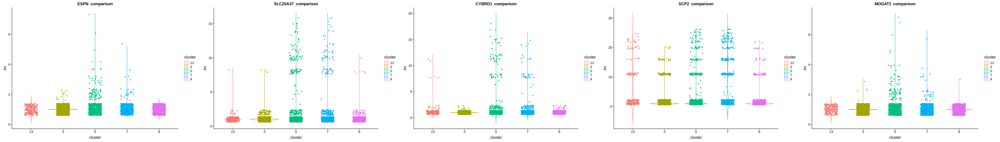

In [497]:
for (i in 0:(length(list5_genes)%/%5)){
    p1 <- suppressMessages(plot_list[[(5*i+1)]])
#        if (class(p1)=="try-error") break
    p2 <- suppressMessages(plot_list[[(5*i+2)]])
 #       if (class(p2)=="try-error") break
    p3 <- suppressMessages(plot_list[[(5*i+3)]])
  #      if (class(p3)=="try-error") break
    p4 <- suppressMessages(plot_list[[(5*i+4)]])
   #     if (class(p4)=="try-error") break
    if (i!=length(list5_genes)%/%5) p5 <- suppressMessages(plot_list[[(5*i+5)]])
    #    if (class(p5)=="try-error") break
    
    if (i!=length(list5_genes)%/%5)gridExtra::grid.arrange(p1, p2, p3, p4, p5, ncol = 5)
    if (i==length(list5_genes)%/%5)gridExtra::grid.arrange(p1, ncol = 5)
}

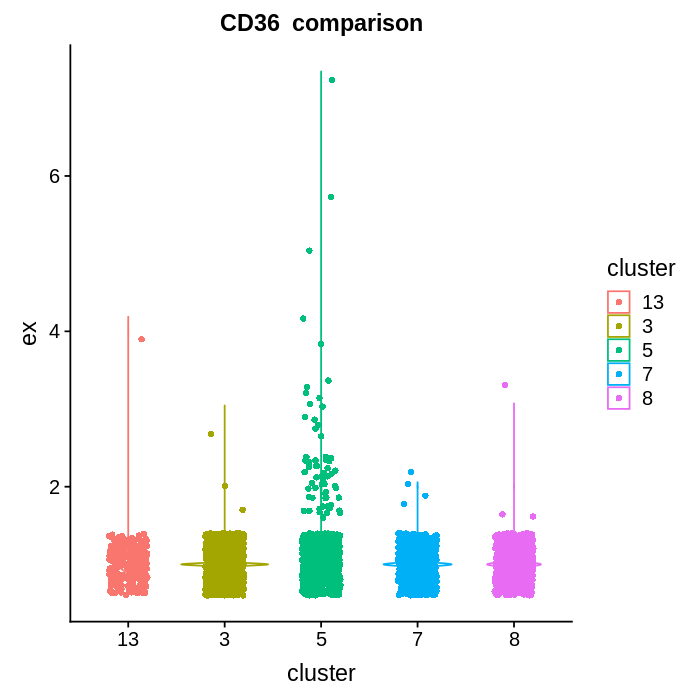

In [510]:
options(repr.plot.width=7/1.2, repr.plot.height=7/1.2)
plot_list[[96]]

# Cluster7 (metaplasia)

In [512]:
list7_unique = setdiff(setdiff(setdiff(setdiff(list7,list3),list5),list8),list13)

list7_genes <- list7_unique[!startsWith(list7_unique,'RPL')]

list7_genes <- list7_genes[!startsWith(list7_genes,'MT-')]

list7_genes <- list7_genes[!startsWith(list7_genes,'RPS')]

In [513]:
options(repr.plot.width=49, repr.plot.height=7)

In [515]:
test <- getBM(filters= "hgnc_symbol", attributes=c("hgnc_symbol","ensembl_gene_id"),
              values=list7_genes,mart=mart)

test2 <- as.data.frame(list7_genes)

colnames(test2) <- "hgnc_symbol"

test3 <- inner_join(test2,test,by="hgnc_symbol")

Warning message:
“Column `hgnc_symbol` joining factor and character vector, coercing into character vector”

In [521]:
# mat_cluster3とlist3_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(test3$ensembl_gene_id, rownames(mat_cluster7))

for (i in 1:length(list7_genes)){
    ensembl <- ensembl_gene_id_T[i] 
    if(i==1)hoge <- test3[test3$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,test3[test3$ensembl_gene_id==ensembl,])
    }
}

list7_ensemble <- hoge

In [523]:
plot_list <- list()

In [524]:
for (i in 1:length(list7_genes)){
    gene_symbol_ <- list7_genes[i]
    gene_symbol <- list7_ensemble$ensembl_gene_id[i]
    df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[gene_symbol,]),
                             cbind(cluster='5',ex=mat_cluster5[gene_symbol,]),
                             cbind(cluster='7',ex=mat_cluster7[gene_symbol,]),
                             cbind(cluster='8',ex=mat_cluster8[gene_symbol,]),
                             cbind(cluster='13',ex=mat_cluster13[gene_symbol,])))
    df$ex <- as.numeric(df$ex)
    p <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
    p <- p+geom_violin(trim=FALSE)+labs(title=paste(gene_symbol_,' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))
    plot_list[[i]] <- p
}

In [525]:
length(plot_list)

[1] 31

In [526]:
options(repr.plot.width=49, repr.plot.height=7)

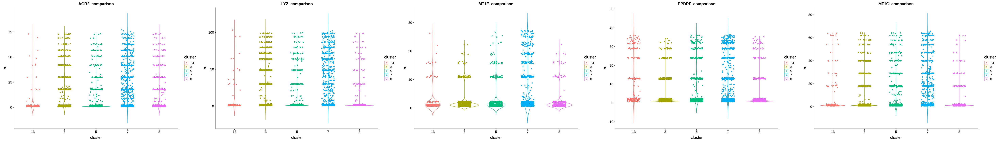

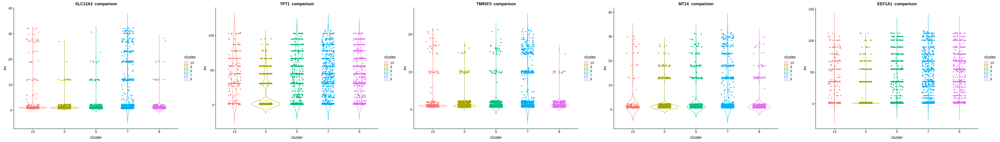

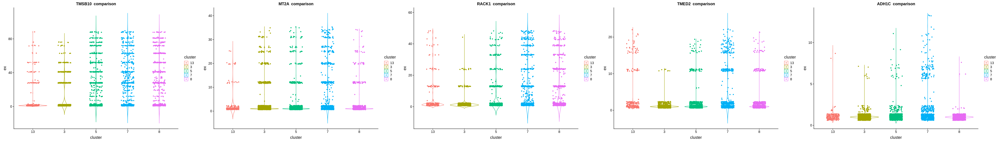

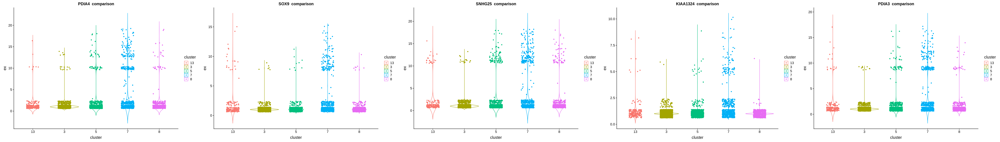

ERROR: Error in plot_list[[(5 * i + 2)]]: subscript out of bounds


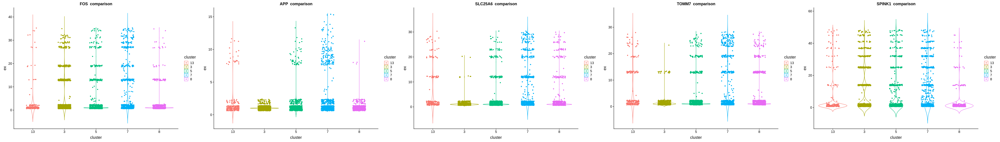

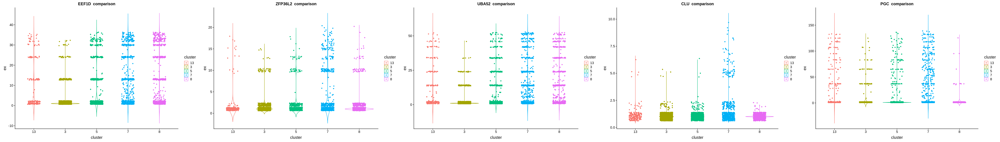

In [527]:
for (i in 0:(length(list5_genes)%/%5)){
    p1 <- suppressMessages(plot_list[[(5*i+1)]])
#        if (class(p1)=="try-error") break
    p2 <- suppressMessages(plot_list[[(5*i+2)]])
 #       if (class(p2)=="try-error") break
    p3 <- suppressMessages(plot_list[[(5*i+3)]])
  #      if (class(p3)=="try-error") break
    p4 <- suppressMessages(plot_list[[(5*i+4)]])
   #     if (class(p4)=="try-error") break
    if (i!=length(list5_genes)%/%5) p5 <- suppressMessages(plot_list[[(5*i+5)]])
    #    if (class(p5)=="try-error") break
    
    if (i!=length(list5_genes)%/%5)gridExtra::grid.arrange(p1, p2, p3, p4, p5, ncol = 5)
    if (i==length(list5_genes)%/%5)gridExtra::grid.arrange(p1, ncol = 5)
}

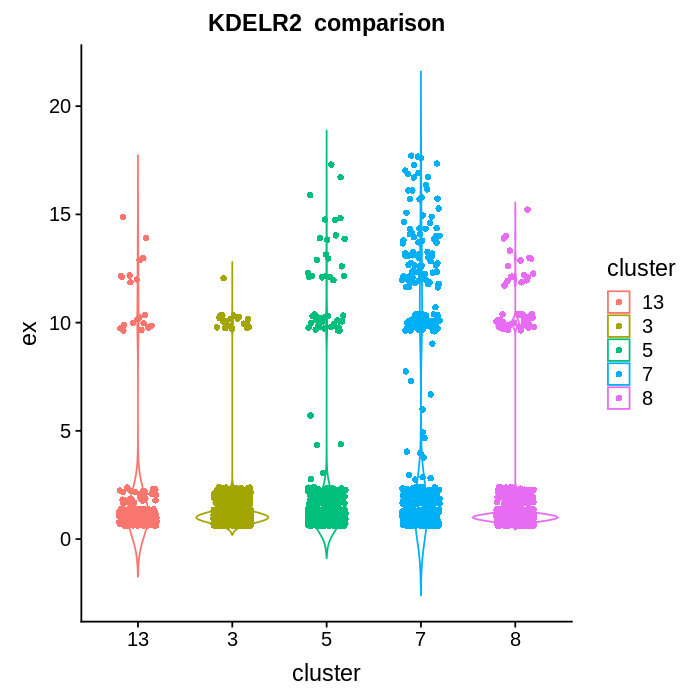

In [529]:
options(repr.plot.width=7/1.2, repr.plot.height=7/1.2)
plot_list[[31]]

# Cluster 8 (stem cell???)

In [ ]:
list8_unique = setdiff(setdiff(setdiff(setdiff(list8,list3),list5),list7),list13)

list8_genes <- list8_unique[!startsWith(list8_unique,'RPL')]

list8_genes <- list8_genes[!startsWith(list8_genes,'MT-')]

list8_genes <- list8_genes[!startsWith(list8_genes,'RPS')]



plot_list <- list()

In [536]:
# いろいろやった

test <- getBM(filters= "hgnc_symbol", attributes=c("hgnc_symbol","ensembl_gene_id"),
              values=list8_genes,mart=mart)

test2 <- as.data.frame(list8_genes)

colnames(test2) <- "hgnc_symbol"

test3 <- inner_join(test2,test,by="hgnc_symbol")

# mat_cluster3とlist8_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(test3$ensembl_gene_id, rownames(mat_cluster8))

for (i in 1:length(list8_genes)){
    ensembl <- ensembl_gene_id_T[i] 
    if(i==1)hoge <- test3[test3$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,test3[test3$ensembl_gene_id==ensembl,])
    }
}

Warning message:
“Column `hgnc_symbol` joining factor and character vector, coercing into character vector”

In [537]:
list8_ensemble <- hoge

plot_list <- list()

for (i in 1:length(list8_genes)){
    gene_symbol_ <- list8_genes[i]
    gene_symbol <- list8_ensemble$ensembl_gene_id[i]
    df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[gene_symbol,]),
                             cbind(cluster='5',ex=mat_cluster5[gene_symbol,]),
                             cbind(cluster='7',ex=mat_cluster7[gene_symbol,]),
                             cbind(cluster='8',ex=mat_cluster8[gene_symbol,]),
                             cbind(cluster='13',ex=mat_cluster13[gene_symbol,])))
    df$ex <- as.numeric(df$ex)
    p <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
    p <- p+geom_violin(trim=FALSE)+labs(title=paste(gene_symbol_,' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))
    plot_list[[i]] <- p
}

In [538]:
list8_ensemble %>% dim

[1] 57  2

In [559]:
list8_ensemble$hgnc_symbol

[1] "H2AFZ"    "SMIM14"   "CKS2"     "HMGB1"    "PTMA"     "HSP90AA1"
 [7] "HMGN2"    "TMSB4X"   "HMGB2"    "HMGN1"    "STMN1"    "PCLAF"   
[13] "CORO1A"   "CKS1B"    "IGLC2"    "TUBB"     "NAP1L1"   "NPM1"    
[19] "HLA-DRA"  "DUT"      "PPIA"     "ARPC2"    "ARHGDIB"  "UBE2C"   
[25] "HIST1H4C" "PSMA7"    "TUBA1B"   "EIF3E"    "H3F3A"    "FAU"     
[31] "ANP32B"   "PSMB3"    "MS4A1"    "RAN"      "NACA"     "HINT1"   
[37] "CD37"     "CD52"     "EEF1B2"   "SUMO2"    "RGS13"    "ACTB"    
[43] "CXCL1"    "HSP90AB1" "CD74"     "LAPTM5"   "S100A10"  "LTB"     
[49] "LGALS1"   "IFITM3"   "LCP1"     "CD79B"    "PTTG1"    "GAPDH"   
[55] "PTPRC"    "BTF3"     "BCAS4"

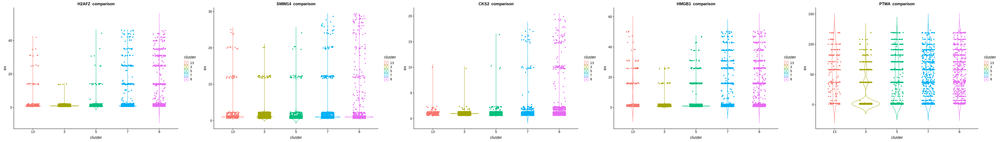

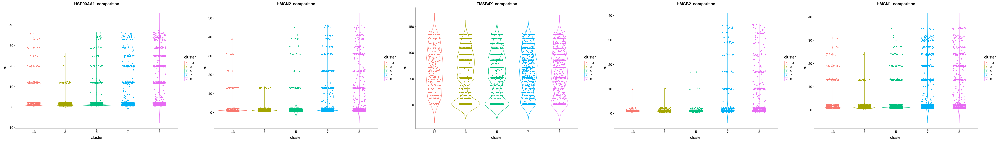

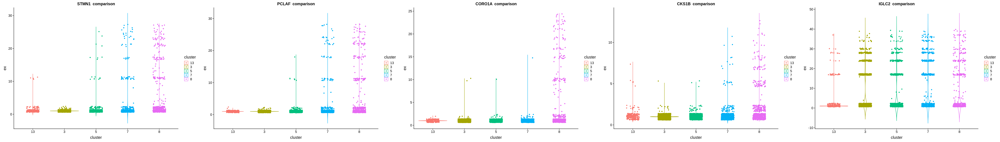

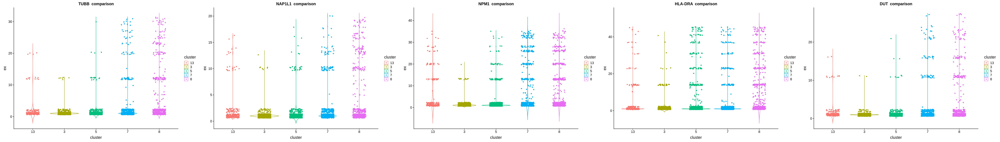

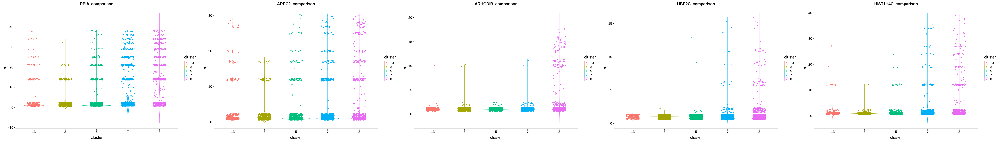

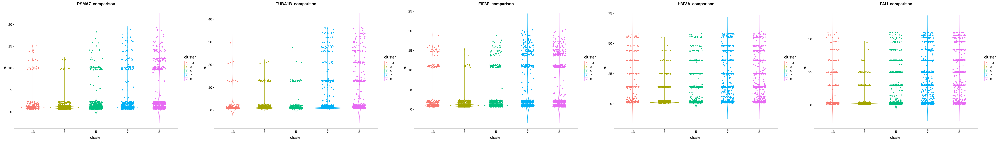

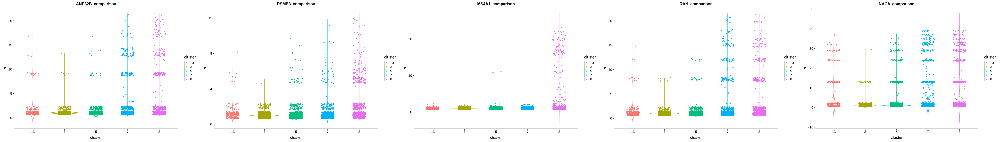

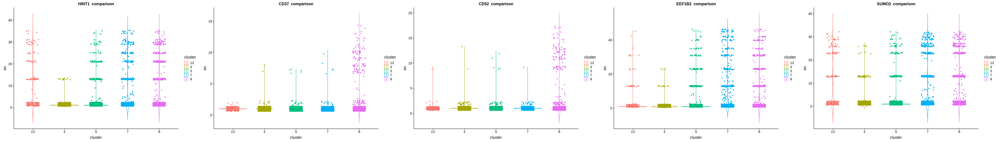

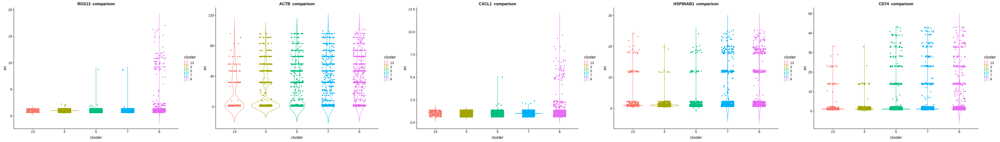

ERROR: Error in plot_list[[(5 * i + 3)]]: subscript out of bounds


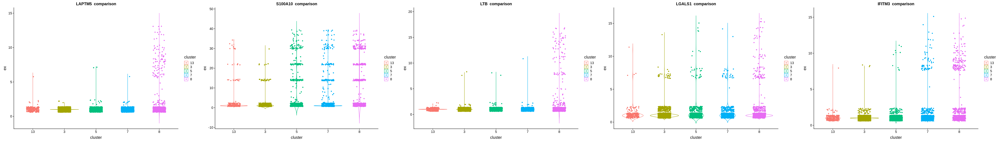

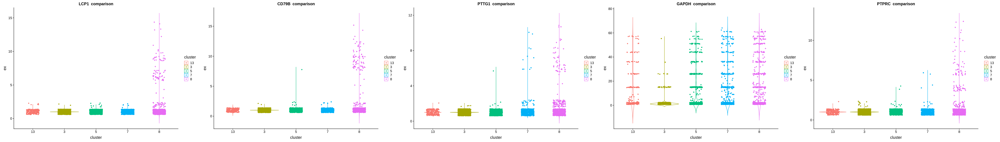

In [539]:
options(repr.plot.width=49, repr.plot.height=7)
for (i in 0:(length(list8_genes)%/%5)){
    p1 <- suppressMessages(plot_list[[(5*i+1)]])
#        if (class(p1)=="try-error") break
    p2 <- suppressMessages(plot_list[[(5*i+2)]])
 #       if (class(p2)=="try-error") break
    p3 <- suppressMessages(plot_list[[(5*i+3)]])
  #      if (class(p3)=="try-error") break
    p4 <- suppressMessages(plot_list[[(5*i+4)]])
   #     if (class(p4)=="try-error") break
    if (i!=length(list8_genes)%/%5) p5 <- suppressMessages(plot_list[[(5*i+5)]])
    #    if (class(p5)=="try-error") break
    
    if (i!=length(list8_genes)%/%5)gridExtra::grid.arrange(p1, p2, p3, p4, p5, ncol = 5)
    if (i==length(list8_genes)%/%5)gridExtra::grid.arrange(p1,p2, ncol = 5)
}

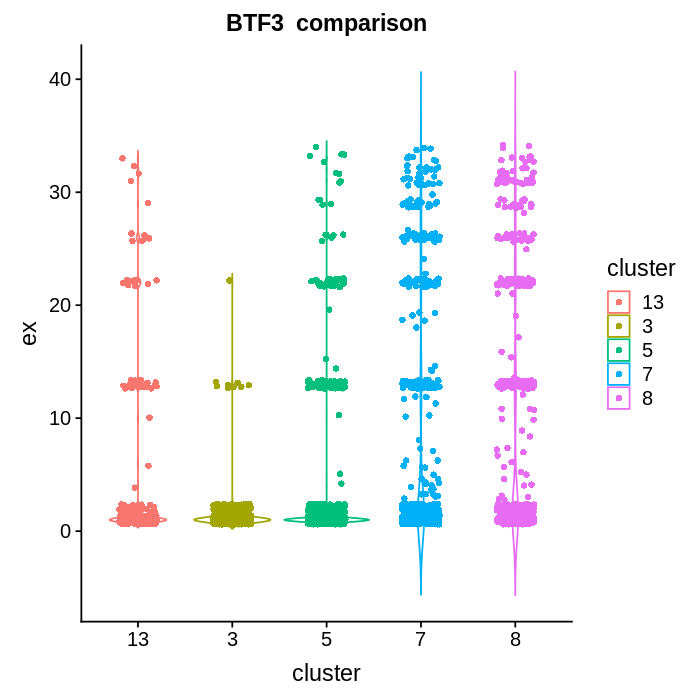

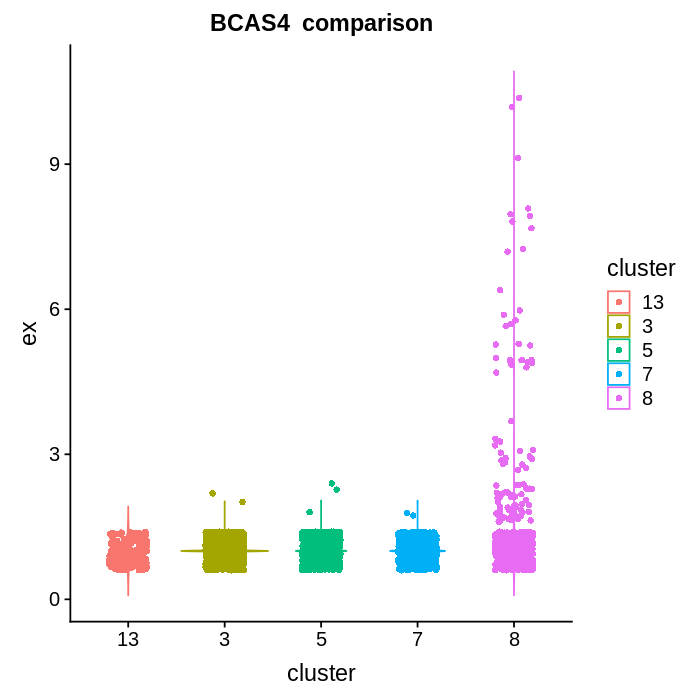

In [540]:
options(repr.plot.width=7/1.2, repr.plot.height=7/1.2)
plot_list[[56]]
plot_list[[57]]

# Cluster 13 (parietal cell)

In [541]:
list13_unique = setdiff(setdiff(setdiff(setdiff(list13,list3),list5),list7),list8)

list13_genes <- list13_unique[!startsWith(list13_unique,'RPL')]

list13_genes <- list13_genes[!startsWith(list13_genes,'MT-')]

list13_genes <- list13_genes[!startsWith(list13_genes,'RPS')]



plot_list <- list()

# いろいろやった

test <- getBM(filters= "hgnc_symbol", attributes=c("hgnc_symbol","ensembl_gene_id"),
              values=list13_genes,mart=mart)

test2 <- as.data.frame(list13_genes)

colnames(test2) <- "hgnc_symbol"

test3 <- inner_join(test2,test,by="hgnc_symbol")


Warning message:
“Column `hgnc_symbol` joining factor and character vector, coercing into character vector”

In [542]:

# mat_cluster3とlist13_ensembleの共通の遺伝子のみにする
ensembl_gene_id_T <- intersect(test3$ensembl_gene_id, rownames(mat_cluster13))

for (i in 1:length(list13_genes)){
    ensembl <- ensembl_gene_id_T[i] 
    if(i==1)hoge <- test3[test3$ensembl_gene_id==ensembl,]
    else{
        hoge <- rbind(hoge,test3[test3$ensembl_gene_id==ensembl,])
    }
}

list13_ensemble <- hoge

plot_list <- list()

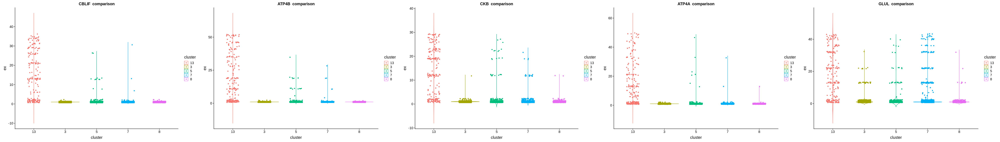

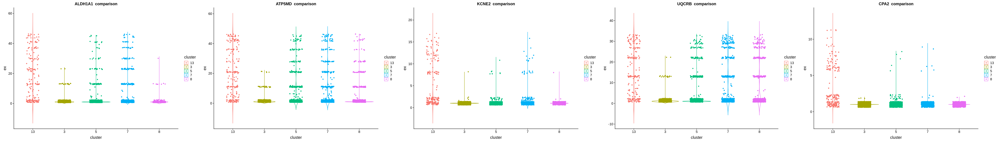

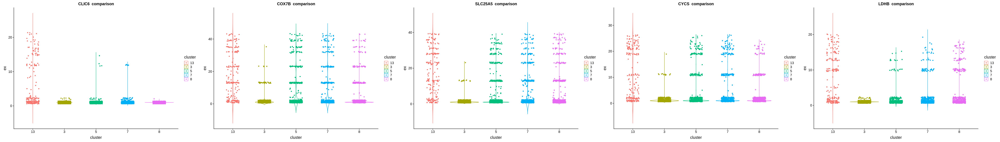

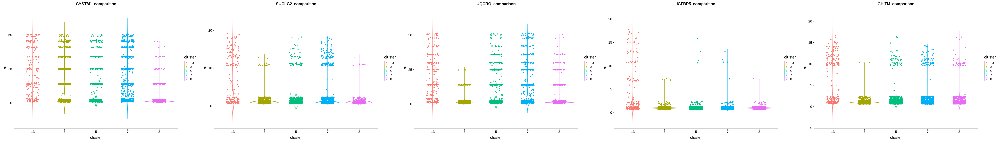

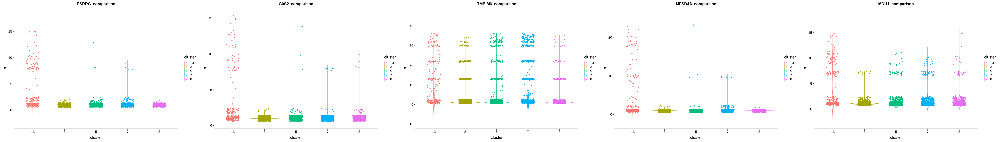

...

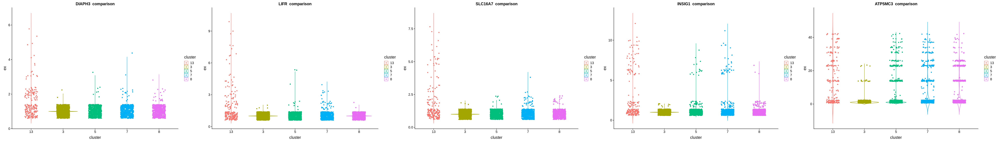

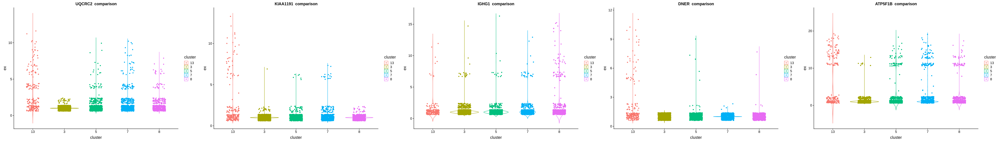

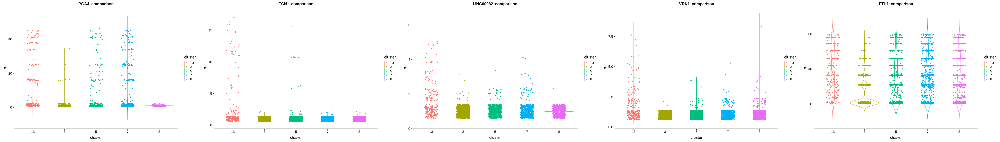

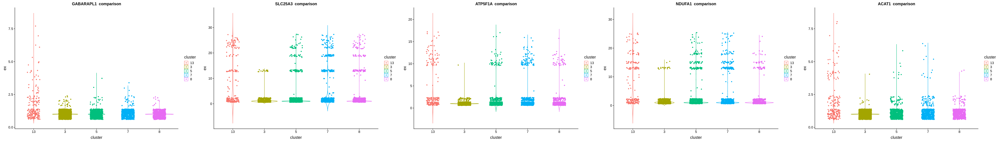

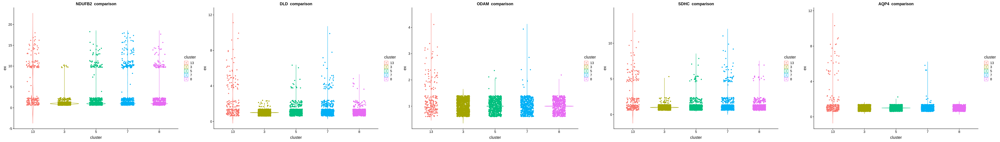

ERROR: Error in plot_list[[(5 * i + 1)]]: subscript out of bounds


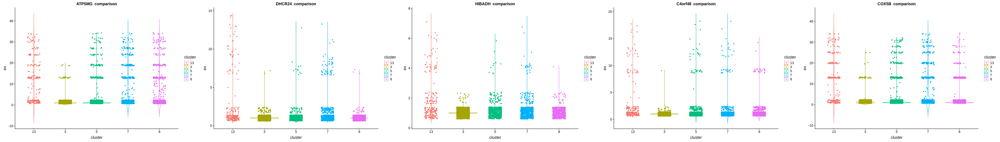

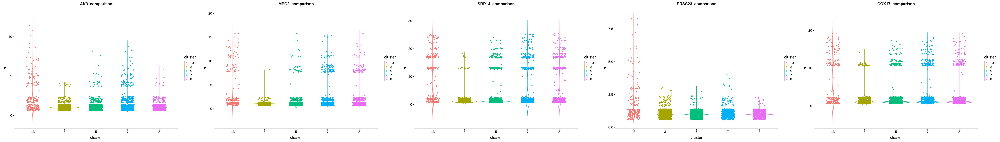

In [543]:


for (i in 1:length(list13_genes)){
    gene_symbol_ <- list13_genes[i]
    gene_symbol <- list13_ensemble$ensembl_gene_id[i]
    df <- as.data.frame(rbind(cbind(cluster="3",ex=mat_cluster3[gene_symbol,]),
                             cbind(cluster='5',ex=mat_cluster5[gene_symbol,]),
                             cbind(cluster='7',ex=mat_cluster7[gene_symbol,]),
                             cbind(cluster='8',ex=mat_cluster8[gene_symbol,]),
                             cbind(cluster='13',ex=mat_cluster13[gene_symbol,])))
    df$ex <- as.numeric(df$ex)
    p <- ggplot(df,aes(x=cluster,y=ex,colour=cluster))
    p <- p+geom_violin(trim=FALSE)+labs(title=paste(gene_symbol_,' comparison'))+geom_jitter(shape=16, position=position_jitter(0.2))
    plot_list[[i]] <- p
}


options(repr.plot.width=49, repr.plot.height=7)
for (i in 0:(length(list13_genes)%/%5)){
    p1 <- suppressMessages(plot_list[[(5*i+1)]])
#        if (class(p1)=="try-error") break
    p2 <- suppressMessages(plot_list[[(5*i+2)]])
 #       if (class(p2)=="try-error") break
    p3 <- suppressMessages(plot_list[[(5*i+3)]])
  #      if (class(p3)=="try-error") break
    p4 <- suppressMessages(plot_list[[(5*i+4)]])
   #     if (class(p4)=="try-error") break
    if (i!=length(list13_genes)%/%5) p5 <- suppressMessages(plot_list[[(5*i+5)]])
    #    if (class(p5)=="try-error") break
    
    if (i!=length(list13_genes)%/%5)gridExtra::grid.arrange(p1, p2, p3, p4, p5, ncol = 5)
    if (i==length(list13_genes)%/%5)gridExtra::grid.arrange(p1,p2, ncol = 5)
}

In [544]:
length(list13_genes)

[1] 90